In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from gpflow.utilities import print_summary, set_trainable, to_default_float
import gpflow
import tensorflow as tf
import tensorflow_probability as tfp
tfd = tfp.distributions

import os
os.environ["CUDA_VISIBLE_DEVICES"] = '2'

from sklearn.metrics import mean_squared_error, mean_absolute_error
from properscoring import crps_gaussian

import sys
sys.path.append('../../src')
from data_preparation import get_birth_data, separate_data
from useful_fun import plot_distribution, percentage_outof_CI, number_outof_CI

In [2]:
# load data

# whole dataset
data = get_birth_data()
x, y = separate_data(data, train_test=False)

# train/test split
df_train = pd.read_csv('../../data/train.csv')
x_train, y_train = separate_data(df_train)
df_test = pd.read_csv('../../data/test.csv')
x_test, y_test = separate_data(df_test)

# get date for x-axis in plots
def get_xticks(data):
    idss = []; yrs = []
    yr = 1969
    for i in range(20):
        df = data.loc[data.year == yr+i]
        yrs.append(yr+i)
        idss.append(df.index[0])
    return idss, yrs
pos, labels = get_xticks(data)

2022-08-24 14:14:37.942038: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-08-24 14:14:40.352499: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9646 MB memory:  -> device: 0, name: GeForce RTX 2080 Ti, pci bus id: 0000:60:00.0, compute capability: 7.5


# Additive Model: two-latent function model

        y = f(x) + g(x) + e
        f = GP(0, RBF)
        g = GP(0, RBF)

        l = InvGama()
        sigma = Gamma()

# Train / Test split: model selection

Assess which kernel helps represent the data best.

    MSE, MAE, Likelihood

Since we have found that the starting point of kernel parameters affects the fit significantly, we will first select the kernel and then run an analysis to find optimal starting conditions for hyperparameters.

In [3]:
def optimise_predict_model(model, epochs=50):
    train_data = (x_train, y_train)
    loss_fn = model.training_loss_closure(train_data) 

    gpflow.utilities.set_trainable(model.q_mu, False)
    gpflow.utilities.set_trainable(model.q_sqrt, False)

    variational_vars = [(model.q_mu, model.q_sqrt)]
    natgrad_opt = gpflow.optimizers.NaturalGradient(gamma=0.1)
    adam_vars = model.trainable_variables
    adam_opt = tf.optimizers.Adam(0.01)

    @tf.function
    def optimisation_step():
        natgrad_opt.minimize(loss_fn, variational_vars)
        adam_opt.minimize(loss_fn, adam_vars)

    for epoch in range(1, epochs + 1):
        optimisation_step()
    
    # fitted values
    mean_train, var_train = model.predict_y(x_train)
    print('Train')
    plot_distribution(x_train, y_train, mean_train, var_train, pos, labels, legend=False)

    # predict
    mean_test, var_test = model.predict_y(x_test)
    print('Test')
    plot_distribution(x_test, y_test, mean_test, var_test, pos, labels)

    print('train ELBO, MSE, MAE: ', model.elbo((x_train,y_train)).numpy(), mean_squared_error(y_train, mean_train), mean_absolute_error(y_train, mean_train))
    print('test ELBO, MSE, MAE: ', model.elbo((x_test,y_test)).numpy(), mean_squared_error(y_test, mean_test), mean_absolute_error(y_test, mean_test))
    print('percentage out of CI (train, test): ', percentage_outof_CI(y_train, mean_train, var_train), percentage_outof_CI(y_test, mean_test, var_test))
    print('number out of CI (train, test): ', number_outof_CI(y_train, mean_train, var_train), number_outof_CI(y_test, mean_test, var_test))
    print('Avg. CRPS (train, test): ', np.mean(crps_gaussian(y_train, mean_train, np.sqrt(var_train))), np.mean(crps_gaussian(y_test, mean_test, np.sqrt(var_test))))

    print_summary(model, fmt='notebook')

The models consist of a single latent function, untrainable noise variance (justify), hyperparameters with priors.

2022-08-22 12:58:31.392470: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.
2022-08-22 12:58:39.782527: I tensorflow/core/util/cuda_solvers.cc:179] Creating GpuSolver handles for stream 0x6f128b0


Train


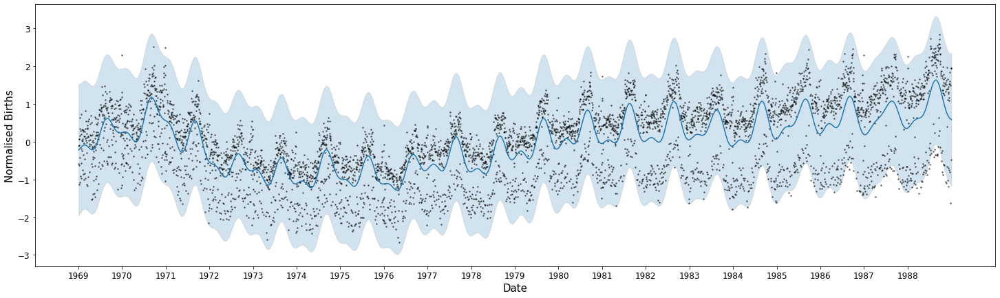

Test


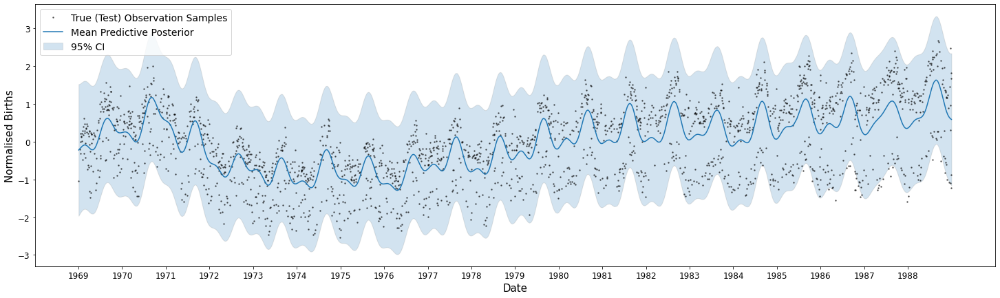

train ELBO, MSE, MAE:  -3577.63233486663 0.5516652707248217 0.6252851348278976
test ELBO, MSE, MAE:  -3641.1493221940805 0.5817814852556517 0.6412468935465121
percentage out of CI (train, test):  1.193037355759828 1.4598540145985401
number out of CI (train, test):  61 32
Avg. CRPS (train, test):  0.42658415003321193 0.4376702211079042


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.8146630718430888
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.41457019347406
SVGP.kernel.kernels[1].base_kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.8298713748865855
SVGP.kernel.kernels[1].base_kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,0.9772458598940812
SVGP.kernel.kernels[1].period,Parameter,Softplus,Uniform,True,(),float64,365.2402608393663
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,0.7227194022653051
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[1.72660461e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-1.70875697e-01...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[2.01769226e-01, 0.00000000e+00, 0.00000000e+00..."


--------------------------------------------------------
Train


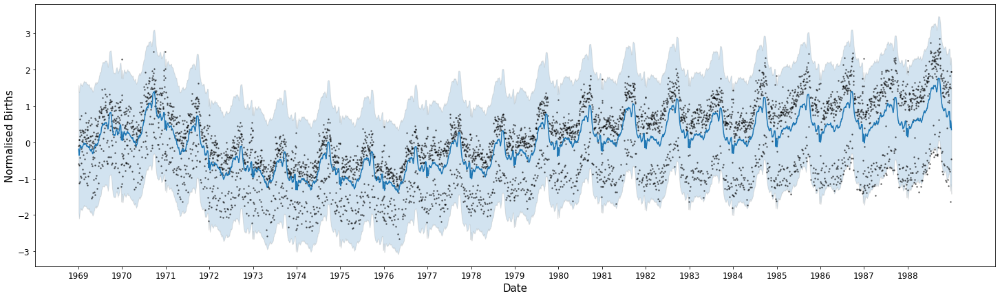

Test


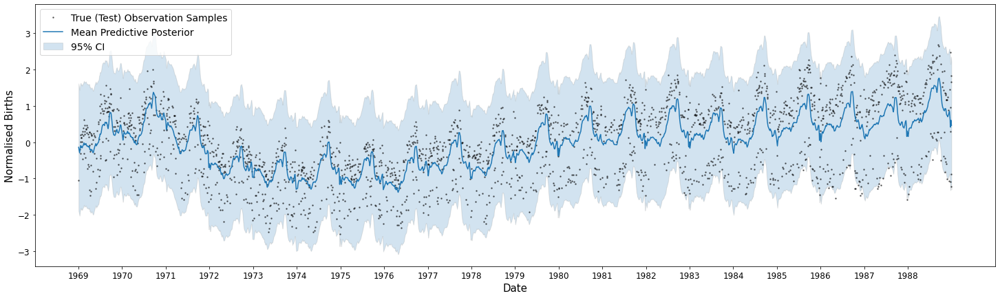

train ELBO, MSE, MAE:  -3593.6812188289878 0.5335049219661269 0.6175146792116951
test ELBO, MSE, MAE:  -3680.0385967472625 0.5738124922850726 0.6399511675083317
percentage out of CI (train, test):  0.9387834930569137 1.1861313868613137
number out of CI (train, test):  48 26
Avg. CRPS (train, test):  0.4202000378340376 0.4351173645243769


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.8118267964069221
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.41557577731639
SVGP.kernel.kernels[1].base_kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.7779605194971229
SVGP.kernel.kernels[1].base_kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,1.247271717201974
SVGP.kernel.kernels[1].period,Parameter,Softplus,Uniform,True,(),float64,364.97759479660135
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,0.7196948658434754
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[1.99153980e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.14569619...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[2.21603626e-01, 0.00000000e+00, 0.00000000e+00..."


--------------------------------------------------------
Train


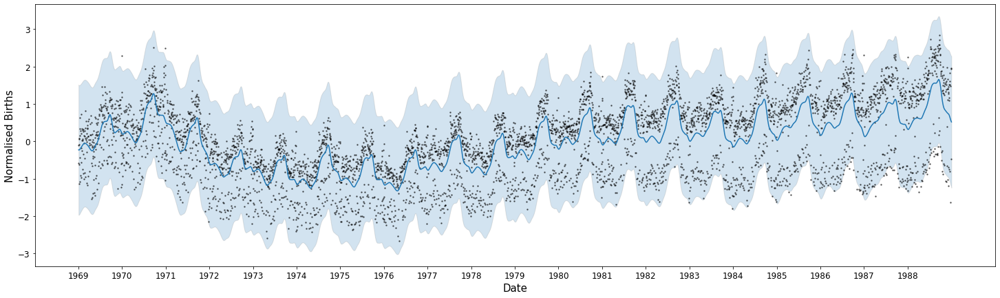

Test


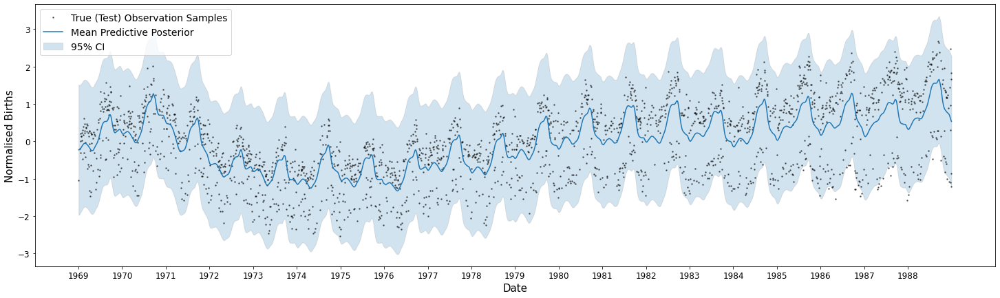

train ELBO, MSE, MAE:  -3573.71659586262 0.5445150284346901 0.6237097196181235
test ELBO, MSE, MAE:  -3637.420839201691 0.574611781145958 0.6402777356821088
percentage out of CI (train, test):  1.2125953451985134 1.2773722627737227
number out of CI (train, test):  62 28
Avg. CRPS (train, test):  0.4240625724332737 0.43521207614389806


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.8146382175305861
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.41425300672076
SVGP.kernel.kernels[1].base_kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.8644415748874348
SVGP.kernel.kernels[1].base_kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,1.055982442080651
SVGP.kernel.kernels[1].period,Parameter,Softplus,Uniform,True,(),float64,365.15346356496684
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,0.7217874304325231
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[1.52939313e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.17596423...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[2.02845525e-01, 0.00000000e+00, 0.00000000e+00..."


--------------------------------------------------------
Train


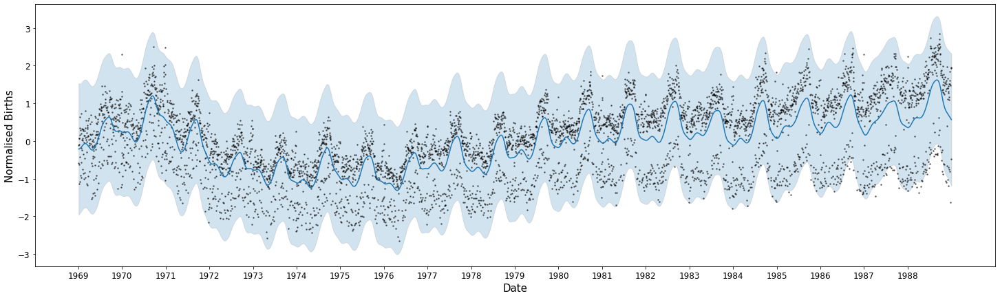

Test


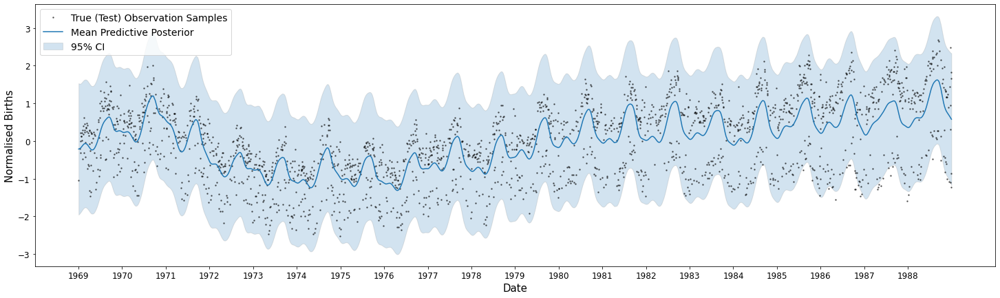

train ELBO, MSE, MAE:  -3576.531357752856 0.5488415770199193 0.6254767658211386
test ELBO, MSE, MAE:  -3638.812921681384 0.578319308805852 0.6412319233704293
percentage out of CI (train, test):  1.1734793663211422 1.4142335766423357
number out of CI (train, test):  60 31
Avg. CRPS (train, test):  0.4256615069692233 0.4365377524371187


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.8150763843921266
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.41290388300497
SVGP.kernel.kernels[1].base_kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.8551873536603225
SVGP.kernel.kernels[1].base_kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,1.0184839131795262
SVGP.kernel.kernels[1].period,Parameter,Softplus,Uniform,True,(),float64,365.1710982867789
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,0.7223244114737267
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[1.66897028e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-1.63854632e-01...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[2.01537723e-01, 0.00000000e+00, 0.00000000e+00..."


--------------------------------------------------------


In [4]:
# Kernel MODEL SELECTION
kernel_list = [gpflow.kernels.Periodic(gpflow.kernels.RBF(), period=365), gpflow.kernels.Periodic(gpflow.kernels.Matern12(), period=365), gpflow.kernels.Periodic(gpflow.kernels.Matern32(), period=365), gpflow.kernels.Periodic(gpflow.kernels.Matern52(), period=365)]

M = 3000

for i in range(len(kernel_list)):
    print(kernel_list[i])

    kernel = gpflow.kernels.RBF(lengthscales=77, variance=1) + kernel_list[i]

    Z = np.linspace(x_train.numpy().min(), x_train.numpy().max(), M)[:, None]
    model = gpflow.models.SVGP(kernel, gpflow.likelihoods.Gaussian(), Z, mean_function=gpflow.mean_functions.Zero(), num_data=M)
    model.likelihood.variance.prior = tfp.distributions.Normal(to_default_float(0), to_default_float(1))
    model.kernel.kernels[0].lengthscales.prior = tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1))
    model.kernel.kernels[0].variance.prior = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))

    model.kernel.kernels[1].period.prior = tfp.distributions.Uniform(to_default_float(0), to_default_float(1))
    model.kernel.kernels[1].base_kernel.lengthscales.prior = tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1))
    model.kernel.kernels[1].base_kernel.variance.prior = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))

    optimise_predict_model(model)
    print('--------------------------------------------------------')

Train


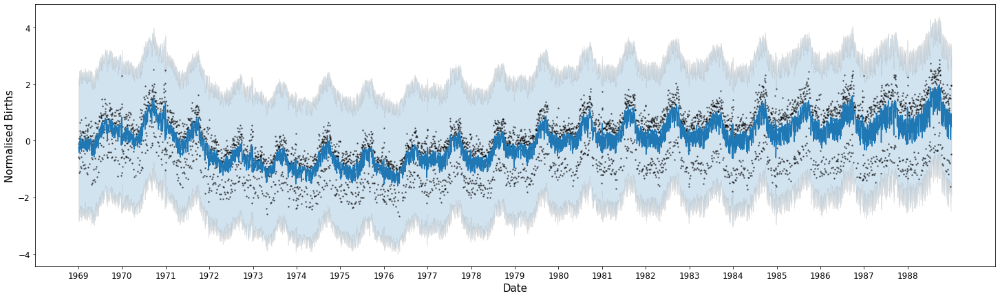

Test


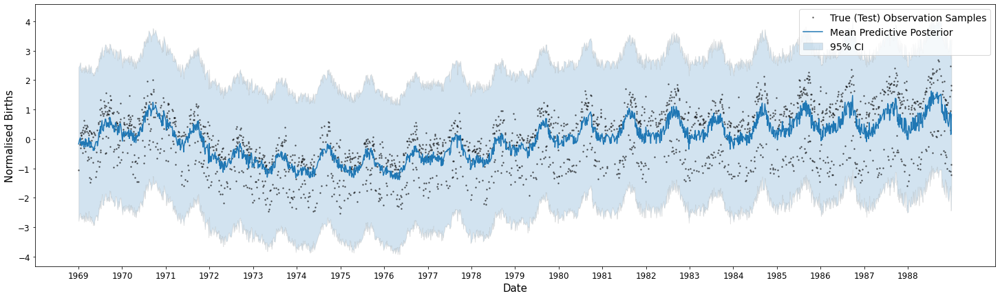

train ELBO, MSE, MAE:  -4401.264227946661 0.32319489875757146 0.4755270516271451
test ELBO, MSE, MAE:  -4932.504709041788 0.5561456378117917 0.6257633718484735
percentage out of CI (train, test):  0.0 0.0
number out of CI (train, test):  0 0
Avg. CRPS (train, test):  0.3902467946069406 0.46362420324971043


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.8300640886956535
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.3539050286658
SVGP.kernel.kernels[1].variance,Parameter,Softplus,Gamma,True,(),float64,0.7411037666799483
SVGP.kernel.kernels[1].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,1.3337500075886337
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,1.0172879765639111
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[2.34540998e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.2061244...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[5.55123234e-01, 0.00000000e+00, 0.00000000e+00..."


--------------------------------------------------------
Train


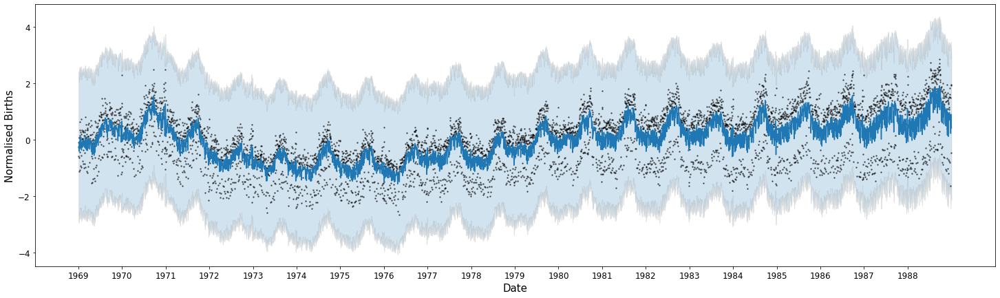

Test


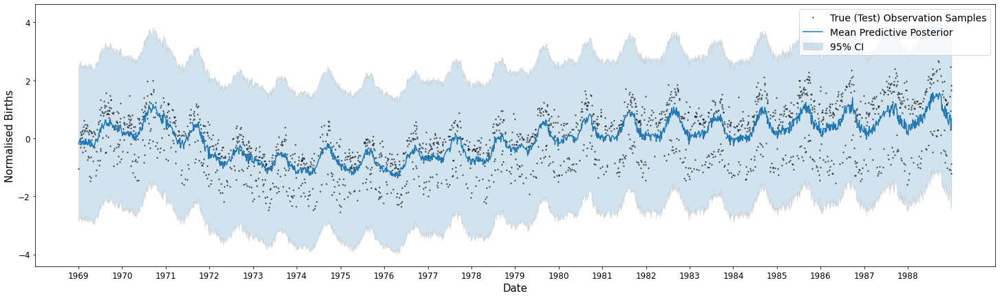

train ELBO, MSE, MAE:  -4516.145182020532 0.37484337194273387 0.5123817226107501
test ELBO, MSE, MAE:  -4936.288343813767 0.5759541817593602 0.6391900755151656
percentage out of CI (train, test):  0.0 0.0
number out of CI (train, test):  0 0
Avg. CRPS (train, test):  0.41479046767867433 0.475939071340898


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.8319820530862916
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.35527836834328
SVGP.kernel.kernels[1].variance,Parameter,Softplus,Gamma,True,(),float64,0.737976783637752
SVGP.kernel.kernels[1].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,1.3316347934876085
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,1.1098897943261967
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[2.00004319e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.21219128...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[5.83276865e-01, 0.00000000e+00, 0.00000000e+00..."


--------------------------------------------------------


In [5]:
# Kernel MODEL SELECTION
kernel_list = [gpflow.kernels.Matern32(), gpflow.kernels.Matern12()]

M = 3000

for i in range(len(kernel_list)):
    print(kernel_list[i])

    kernel = gpflow.kernels.RBF(lengthscales=77, variance=1) + kernel_list[i]

    Z = np.linspace(x_train.numpy().min(), x_train.numpy().max(), M)[:, None]
    model = gpflow.models.SVGP(kernel, gpflow.likelihoods.Gaussian(), Z, mean_function=gpflow.mean_functions.Zero(), num_data=M)
    model.likelihood.variance.prior = tfp.distributions.Normal(to_default_float(0), to_default_float(1))
    model.kernel.kernels[0].lengthscales.prior = tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1))
    model.kernel.kernels[0].variance.prior = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))
    model.kernel.kernels[1].lengthscales.prior = tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1))
    model.kernel.kernels[1].variance.prior = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))

    optimise_predict_model(model)
    print('--------------------------------------------------------')

Train


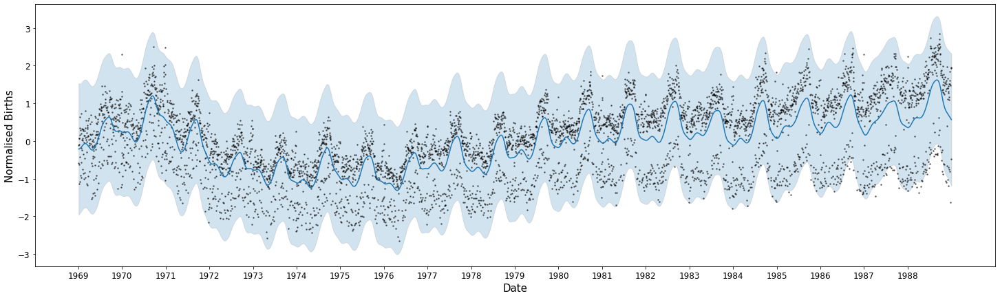

Test


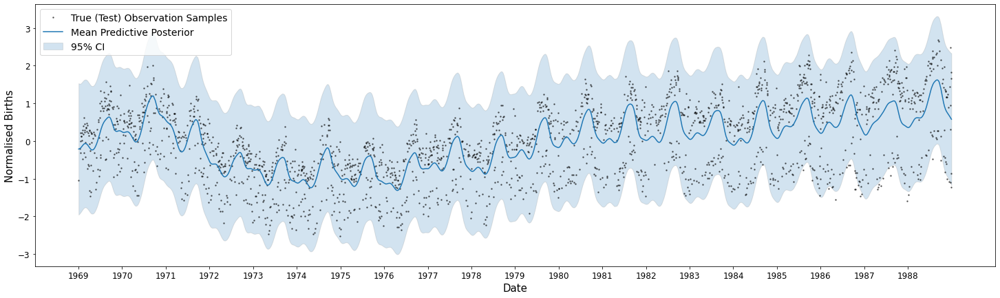

train ELBO, MSE, MAE:  -3576.531357752856 0.5488415770199193 0.6254767658211386
test ELBO, MSE, MAE:  -3638.812921681384 0.578319308805852 0.6412319233704293
percentage out of CI (train, test):  1.1734793663211422 1.4142335766423357
number out of CI (train, test):  60 31
Avg. CRPS (train, test):  0.4256615069692233 0.4365377524371187


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.8150763843921266
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.41290388300497
SVGP.kernel.kernels[1].base_kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.8551873536603225
SVGP.kernel.kernels[1].base_kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,1.0184839131795262
SVGP.kernel.kernels[1].period,Parameter,Softplus,Uniform,True,(),float64,365.1710982867789
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,0.7223244114737267
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[1.66897028e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-1.63854632e-01...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[2.01537723e-01, 0.00000000e+00, 0.00000000e+00..."


--------------------------------------------------------
Train


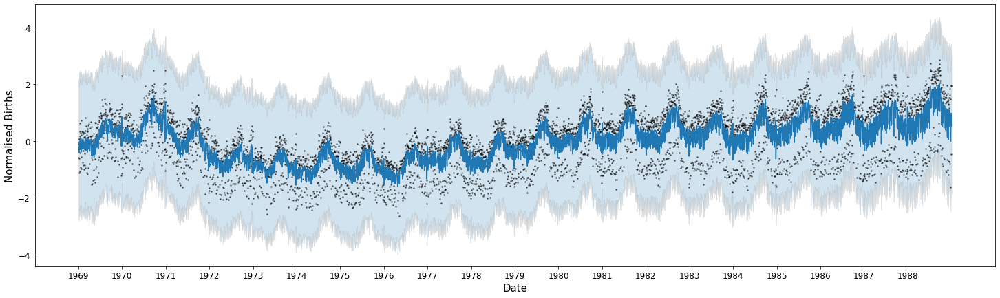

Test


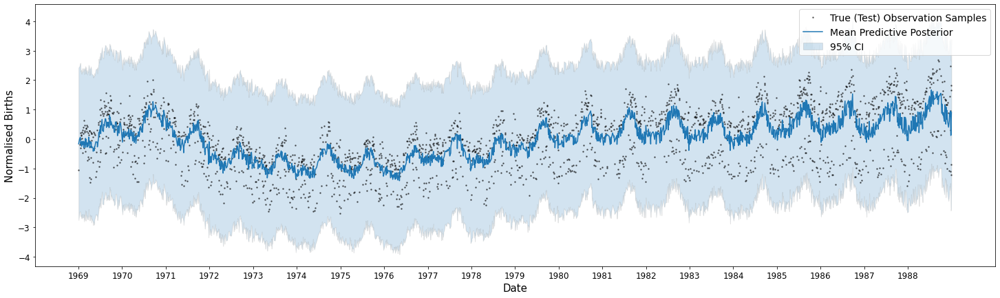

train ELBO, MSE, MAE:  -4360.189750353971 0.31180773289423463 0.46576809493434307
test ELBO, MSE, MAE:  -4926.86135225122 0.5501801088303242 0.6210886193990122
percentage out of CI (train, test):  0.0 0.0
number out of CI (train, test):  0 0
Avg. CRPS (train, test):  0.38297433765122957 0.4594110073007503


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.8289502194248447
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.35359243503596
SVGP.kernel.kernels[1].variance,Parameter,Softplus,Gamma,True,(),float64,0.7426357409196467
SVGP.kernel.kernels[1].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,1.3317205531130984
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,0.9861220065346527
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[2.41927315e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.20487446...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[5.43006812e-01, 0.00000000e+00, 0.00000000e+00..."


--------------------------------------------------------
Train


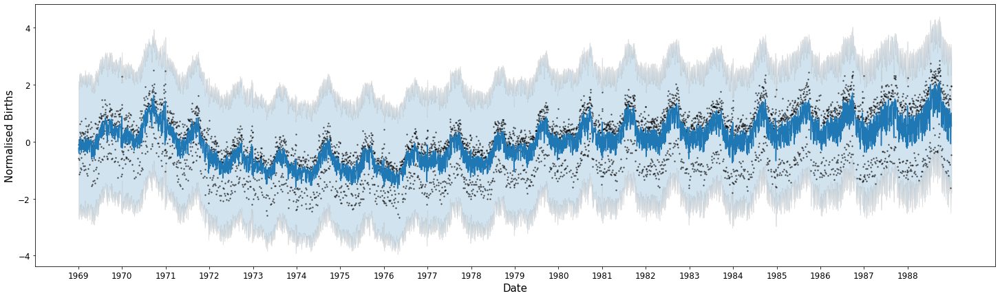

Test


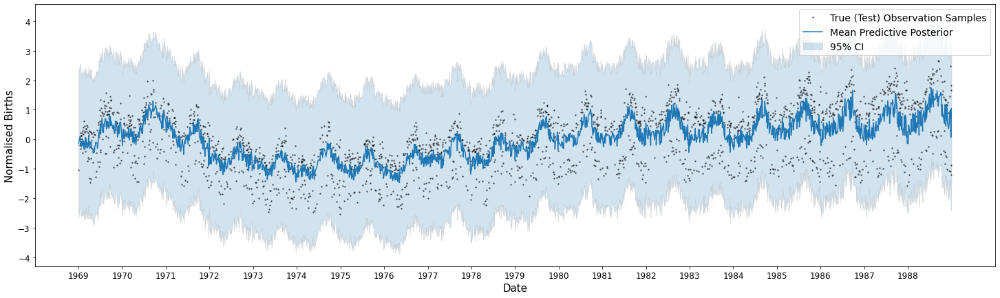

train ELBO, MSE, MAE:  -4291.984386505638 0.2983447552797282 0.4539860018422738
test ELBO, MSE, MAE:  -4903.248936819511 0.5406585978444421 0.6138271725172849
percentage out of CI (train, test):  0.0 0.0
number out of CI (train, test):  0 0
Avg. CRPS (train, test):  0.3721716210765955 0.4521001773342021


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.8274784331397734
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.35290486529769
SVGP.kernel.kernels[1].variance,Parameter,Softplus,Gamma,True,(),float64,0.7456638702249219
SVGP.kernel.kernels[1].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,1.324675162551701
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,0.9352895185097309
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[2.42684838e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.20397761...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[5.27833551e-01, 0.00000000e+00, 0.00000000e+00..."


--------------------------------------------------------


In [5]:
# Kernel MODEL SELECTION
kernel_list = [gpflow.kernels.Periodic(gpflow.kernels.Matern32(), period=365), gpflow.kernels.Matern52(), gpflow.kernels.RBF()]

M = 3000

for i in range(len(kernel_list)):
    print(kernel_list[i])

    kernel = gpflow.kernels.RBF(lengthscales=77, variance=1) + kernel_list[i]

    Z = np.linspace(x_train.numpy().min(), x_train.numpy().max(), M)[:, None]
    model = gpflow.models.SVGP(kernel, gpflow.likelihoods.Gaussian(), Z, mean_function=gpflow.mean_functions.Zero(), num_data=M)
    model.likelihood.variance.prior = tfp.distributions.Normal(to_default_float(0), to_default_float(1))
    model.kernel.kernels[0].lengthscales.prior = tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1))
    model.kernel.kernels[0].variance.prior = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))

    if i == 0:
        model.kernel.kernels[1].period.prior = tfp.distributions.Uniform(to_default_float(0), to_default_float(1))
        model.kernel.kernels[1].base_kernel.lengthscales.prior = tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1))
        model.kernel.kernels[1].base_kernel.variance.prior = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))
    else:
        model.kernel.kernels[1].lengthscales.prior = tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1))
        model.kernel.kernels[1].variance.prior = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))
    
    optimise_predict_model(model)
    print('--------------------------------------------------------')

Starting Value l:  1
Train


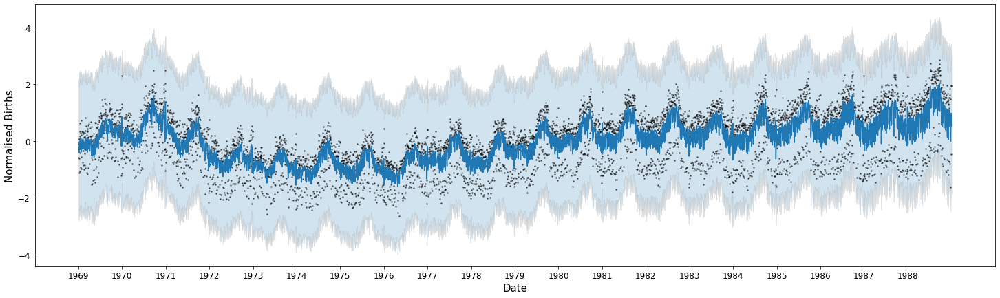

Test


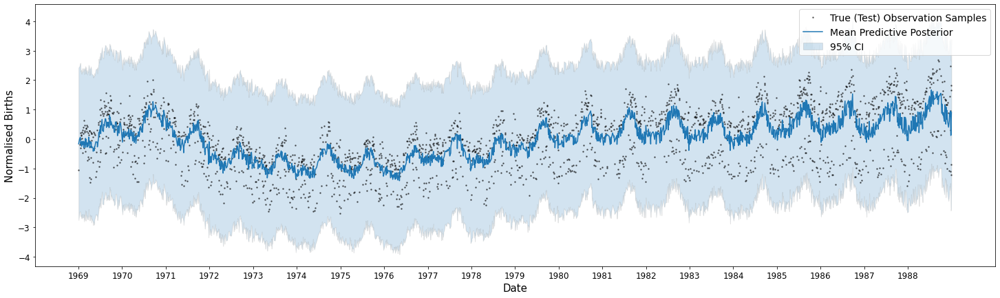

train ELBO, MSE, MAE:  -4360.189750353971 0.31180773289423463 0.46576809493434307
test ELBO, MSE, MAE:  -4926.86135225122 0.5501801088303242 0.6210886193990122
percentage out of CI (train, test):  0.0 0.0
number out of CI (train, test):  0 0
Avg. CRPS (train, test):  0.38297433765122957 0.4594110073007503


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.8289502194248447
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.35359243503596
SVGP.kernel.kernels[1].variance,Parameter,Softplus,Gamma,True,(),float64,0.7426357409196467
SVGP.kernel.kernels[1].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,1.3317205531130984
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,0.9861220065346527
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[2.41927315e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.20487446...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[5.43006812e-01, 0.00000000e+00, 0.00000000e+00..."


--------------------------------------------------------
Starting Value l:  7
Train


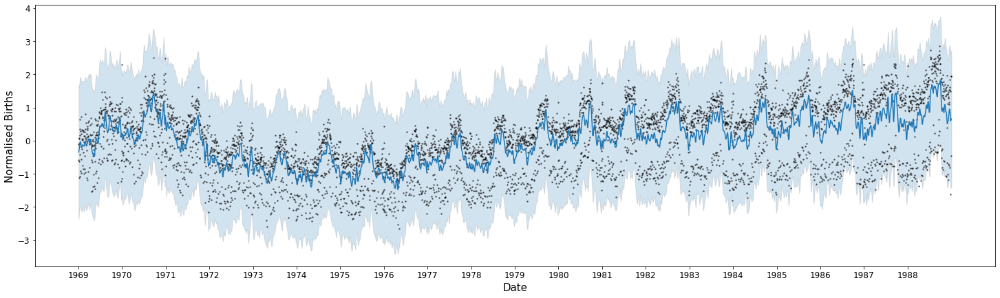

Test


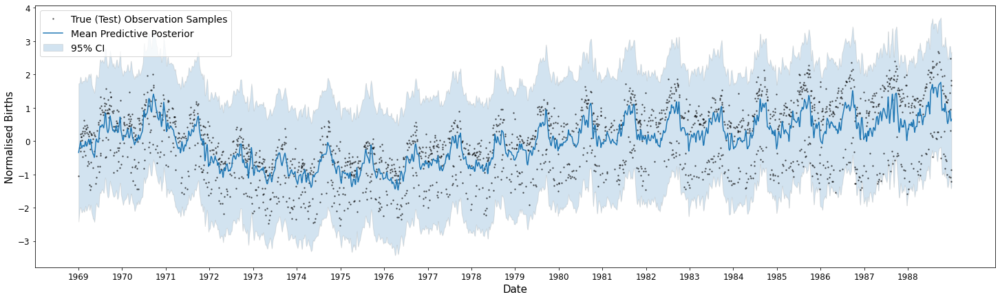

train ELBO, MSE, MAE:  -4055.018666471695 0.5009678557401027 0.5952490492628444
test ELBO, MSE, MAE:  -4419.568340498771 0.6653071796124542 0.6883105797056012
percentage out of CI (train, test):  0.17602190494817133 0.5930656934306568
number out of CI (train, test):  9 13
Avg. CRPS (train, test):  0.4149180175701478 0.4707277868803408


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.8294740003792885
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.3463602545126
SVGP.kernel.kernels[1].variance,Parameter,Softplus,Gamma,True,(),float64,0.7574375728108309
SVGP.kernel.kernels[1].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,7.470202908145952
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,0.7874044721576254
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[1.86000909e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.27659358...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[4.17300058e-01, 0.00000000e+00, 0.00000000e+00..."


--------------------------------------------------------
Starting Value l:  30
Train


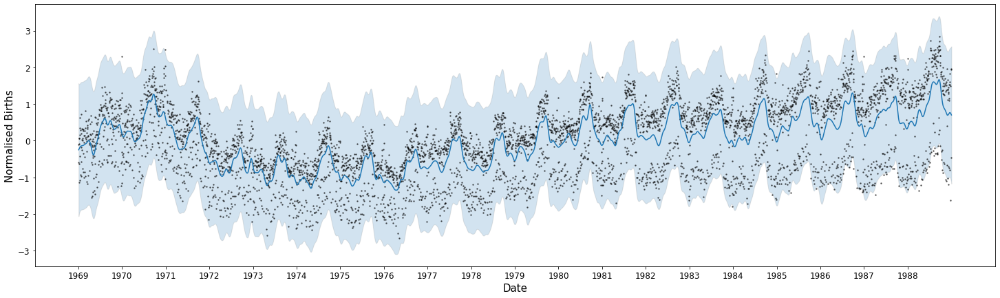

Test


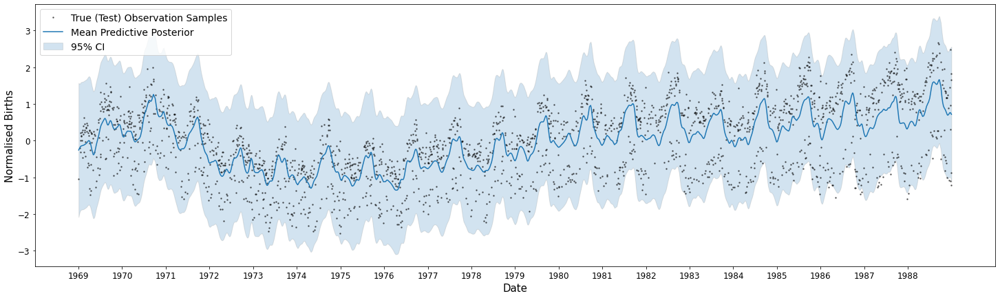

train ELBO, MSE, MAE:  -3741.217735378784 0.5359181457410834 0.6180485585614874
test ELBO, MSE, MAE:  -3882.9275879871443 0.6003392175093787 0.6539861967881522
percentage out of CI (train, test):  0.9583414824955995 1.1861313868613137
number out of CI (train, test):  49 26
Avg. CRPS (train, test):  0.42154087709561233 0.44487484495908625


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.8388452028416559
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.34305594335275
SVGP.kernel.kernels[1].variance,Parameter,Softplus,Gamma,True,(),float64,0.7733306370295954
SVGP.kernel.kernels[1].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,30.43842209056089
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,0.7199645462461258
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[1.97755561e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.19658359...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[2.90205220e-01, 0.00000000e+00, 0.00000000e+00..."


--------------------------------------------------------
Starting Value l:  77
Train


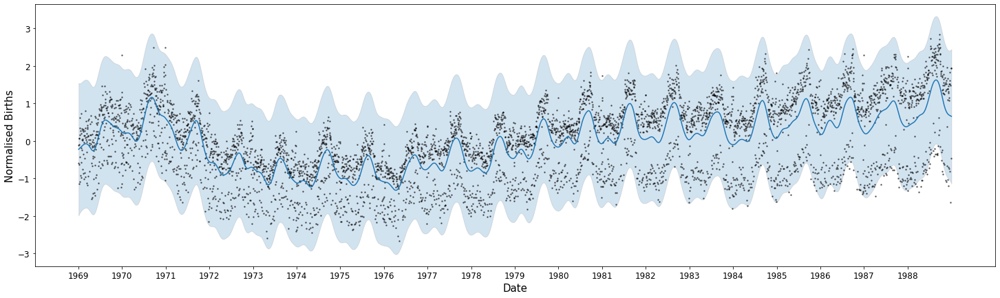

Test


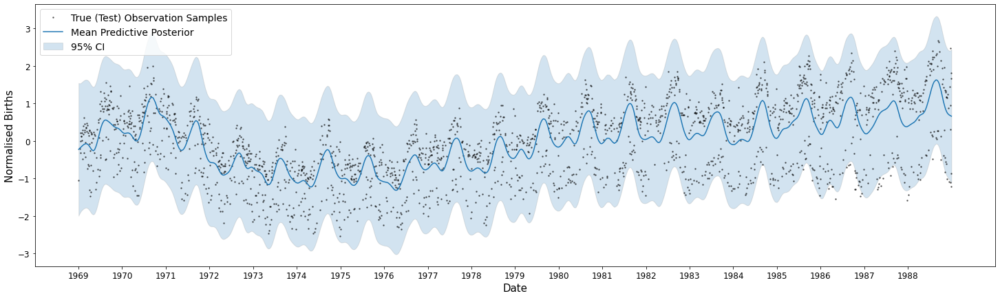

train ELBO, MSE, MAE:  -3626.6207227802915 0.5482247746128731 0.6239609195082522
test ELBO, MSE, MAE:  -3710.3633414219858 0.5875446261351333 0.6452722652244529
percentage out of CI (train, test):  1.1343633874437709 1.5967153284671534
number out of CI (train, test):  58 35
Avg. CRPS (train, test):  0.4254636677804827 0.4398801579675621


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.8297573619956635
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.3605394979586
SVGP.kernel.kernels[1].variance,Parameter,Softplus,Gamma,True,(),float64,0.7911766098686338
SVGP.kernel.kernels[1].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.42087159464795
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,0.7214014443332935
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[2.09504112e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.17192257...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[2.33361759e-01, 0.00000000e+00, 0.00000000e+00..."


--------------------------------------------------------
Starting Value l:  200
Train


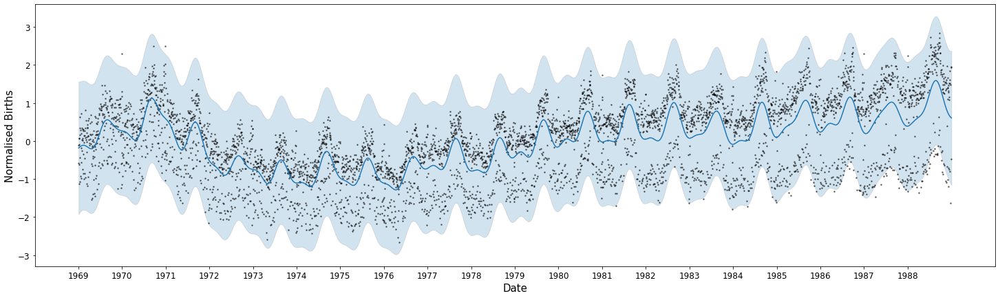

Test


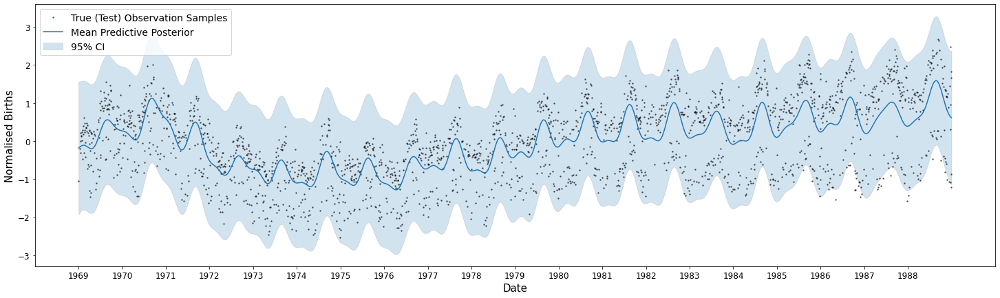

train ELBO, MSE, MAE:  -3592.7697183687674 0.5530533305339654 0.6261822326684957
test ELBO, MSE, MAE:  -3664.456288913924 0.5870794138882387 0.6447855937788949
percentage out of CI (train, test):  1.3103852923919421 1.4598540145985401
number out of CI (train, test):  67 32
Avg. CRPS (train, test):  0.4269945998614995 0.43961479828294403


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.8176583123287983
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.34869979440728
SVGP.kernel.kernels[1].variance,Parameter,Softplus,Gamma,True,(),float64,0.8504010745583069
SVGP.kernel.kernels[1].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,200.3521902717503
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,0.7223991295261257
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[1.83137696e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-1.42821674e-01...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[2.08394390e-01, 0.00000000e+00, 0.00000000e+00..."


--------------------------------------------------------


In [6]:
starting_values_l = [1, 7, 30, 77, 200]

M = 3000

for l in starting_values_l:
    print('Starting Value l: ', l)
    kernel = gpflow.kernels.RBF(lengthscales=77, variance=1) + gpflow.kernels.Matern52(lengthscales=l)
    Z = np.linspace(x_train.numpy().min(), x_train.numpy().max(), M)[:, None]
    model = gpflow.models.SVGP(kernel, gpflow.likelihoods.Gaussian(), Z, mean_function=gpflow.mean_functions.Zero(), num_data=M)
    
    model.likelihood.variance.prior = tfp.distributions.Normal(to_default_float(0), to_default_float(1))
    model.kernel.kernels[0].lengthscales.prior = tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1))
    model.kernel.kernels[0].variance.prior = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))
    model.kernel.kernels[1].lengthscales.prior = tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1))
    model.kernel.kernels[1].variance.prior = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))

    optimise_predict_model(model)
    print('--------------------------------------------------------')

Train


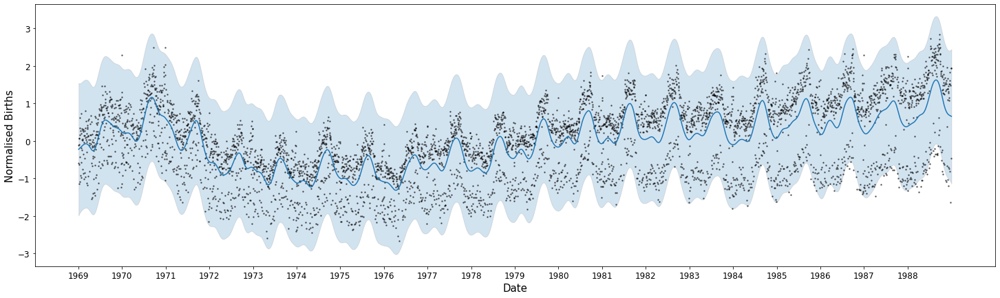

Test


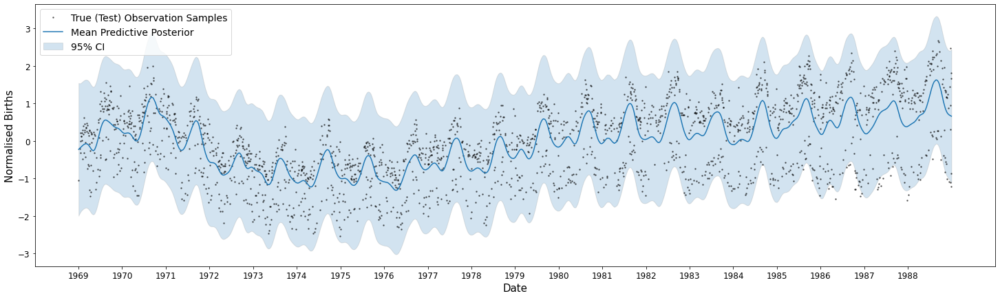

train ELBO, MSE, MAE:  -3626.6207227802915 0.5482247746128731 0.6239609195082522
test ELBO, MSE, MAE:  -3710.3633414219858 0.5875446261351333 0.6452722652244529
percentage out of CI (train, test):  1.1343633874437709 1.5967153284671534
number out of CI (train, test):  58 35
Avg. CRPS (train, test):  0.4254636677804827 0.4398801579675621


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.8297573619956635
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.3605394979586
SVGP.kernel.kernels[1].variance,Parameter,Softplus,Gamma,True,(),float64,0.7911766098686338
SVGP.kernel.kernels[1].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.42087159464795
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,0.7214014443332935
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[2.09504112e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.17192257...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[2.33361759e-01, 0.00000000e+00, 0.00000000e+00..."


--------------------------------------------------------
Train


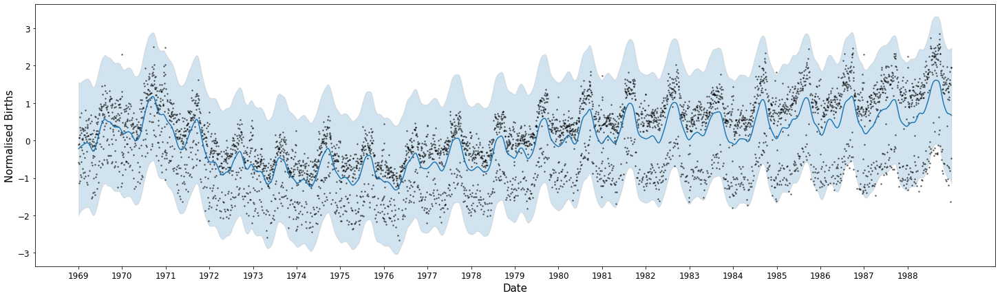

Test


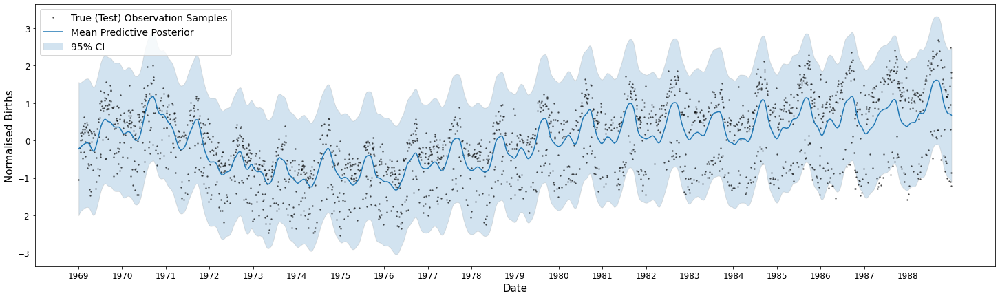

train ELBO, MSE, MAE:  -3645.5951883519065 0.5444874464680851 0.622357583162877
test ELBO, MSE, MAE:  -3743.477964869324 0.5900814530823494 0.6472807808567568
percentage out of CI (train, test):  1.0756894191277135 1.5967153284671534
number out of CI (train, test):  55 35
Avg. CRPS (train, test):  0.42424201500726616 0.4409045107611464


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.8307462233900045
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.35395710321718
SVGP.kernel.kernels[1].variance,Parameter,Softplus,Gamma,True,(),float64,0.778037457084379
SVGP.kernel.kernels[1].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.42752556674014
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,0.7208521304091
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[2.30518397e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.17275779...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[2.44031244e-01, 0.00000000e+00, 0.00000000e+00..."


--------------------------------------------------------
Train


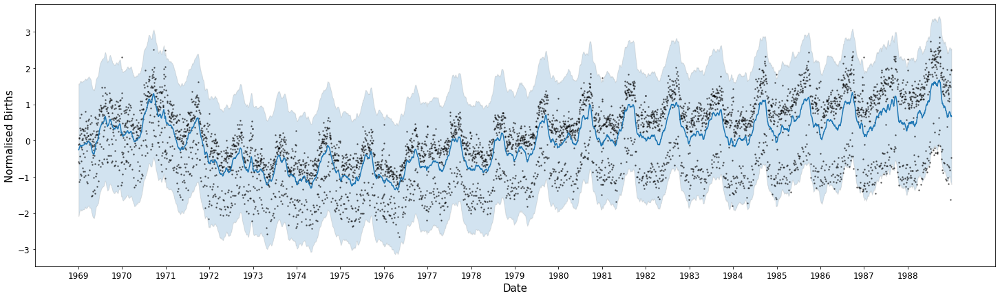

Test


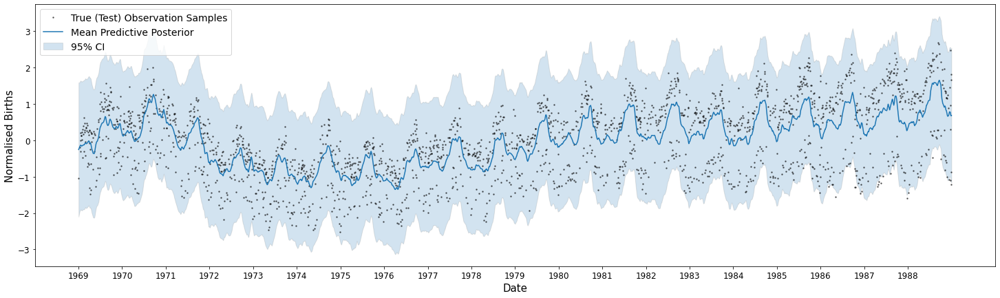

train ELBO, MSE, MAE:  -3754.22480658088 0.5197983911876636 0.6086744306102372
test ELBO, MSE, MAE:  -3947.528364090099 0.6060375963039735 0.6576181605761747
percentage out of CI (train, test):  0.6454136514766282 1.0036496350364963
number out of CI (train, test):  33 22
Avg. CRPS (train, test):  0.4164973458668316 0.4474659747292212


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.8291364839531058
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.34527675234712
SVGP.kernel.kernels[1].variance,Parameter,Softplus,Gamma,True,(),float64,0.7490801571279244
SVGP.kernel.kernels[1].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.44656830336368
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,0.7193469016202022
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[2.25125480e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.20381819...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[3.04309677e-01, 0.00000000e+00, 0.00000000e+00..."


--------------------------------------------------------


In [23]:
# Kernel MODEL SELECTION
kernel_list = [gpflow.kernels.Matern52(lengthscales=77), gpflow.kernels.Matern32(lengthscales=77), gpflow.kernels.Matern12(lengthscales=77)]

M = 3000

for i in range(len(kernel_list)):
    print(kernel_list[i])

    kernel = gpflow.kernels.RBF(lengthscales=77, variance=1) + kernel_list[i]

    Z = np.linspace(x_train.numpy().min(), x_train.numpy().max(), M)[:, None]
    model = gpflow.models.SVGP(kernel, gpflow.likelihoods.Gaussian(), Z, mean_function=gpflow.mean_functions.Zero(), num_data=M)
    model.likelihood.variance.prior = tfp.distributions.Normal(to_default_float(0), to_default_float(1))
    model.kernel.kernels[0].lengthscales.prior = tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1))
    model.kernel.kernels[0].variance.prior = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))
    model.kernel.kernels[1].lengthscales.prior = tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1))
    model.kernel.kernels[1].variance.prior = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))

    optimise_predict_model(model)
    print('--------------------------------------------------------')

Starting Value p:  1
Train


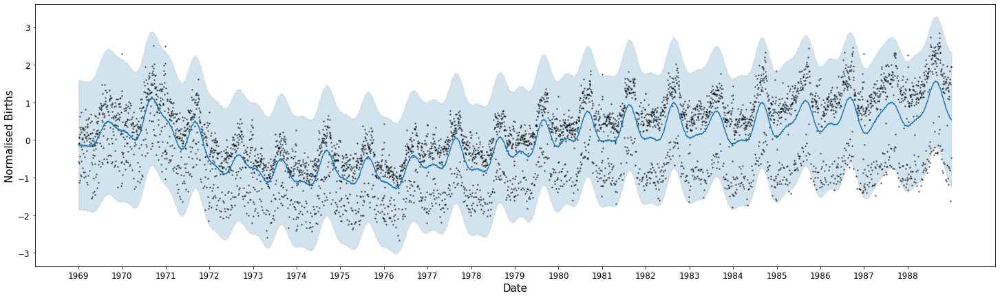

Test


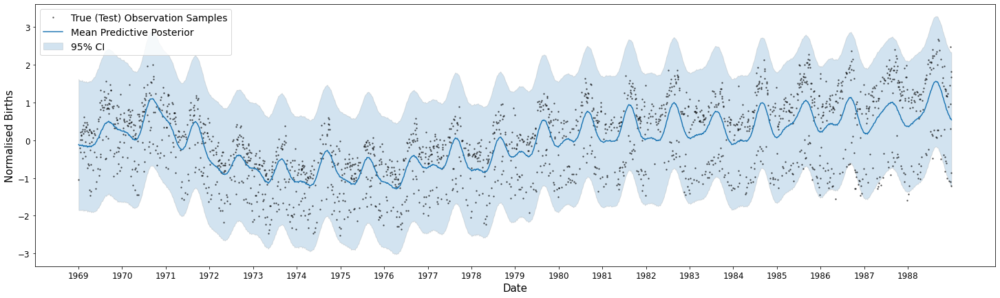

train ELBO, MSE, MAE:  -3705.4359108148537 0.5540677729342918 0.6317000423369221
test ELBO, MSE, MAE:  -3779.1592083371575 0.5879882283335984 0.6503676447375593
percentage out of CI (train, test):  0.9192255036182281 1.094890510948905
number out of CI (train, test):  47 24
Avg. CRPS (train, test):  0.42913576002489034 0.441626829290756


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.8095622303854677
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.34964257919076
SVGP.kernel.kernels[1].base_kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.7342676876112856
SVGP.kernel.kernels[1].base_kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,1.288099356084098
SVGP.kernel.kernels[1].period,Parameter,Softplus,Uniform,True,(),float64,0.9692545429492696
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,0.7226897801329182
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[2.10386551e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-1.01359804e-01...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[1.62406400e-01, 0.00000000e+00, 0.00000000e+00..."


--------------------------------------------------------
Starting Value p:  7
Train


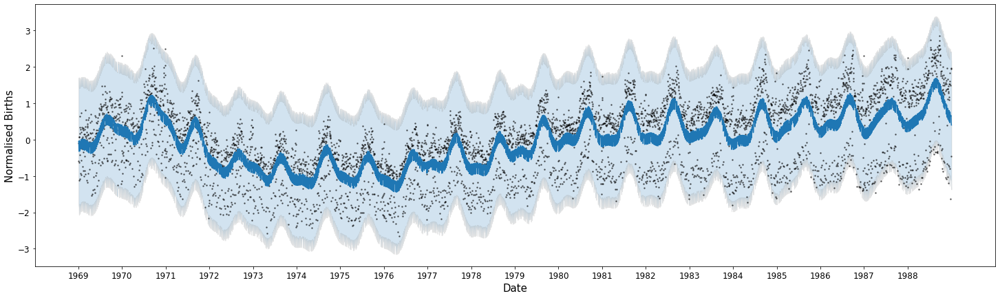

Test


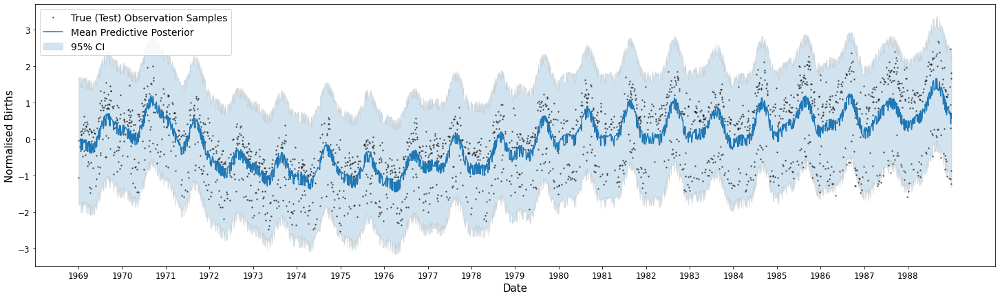

train ELBO, MSE, MAE:  -3578.8211455338787 0.5376962508058696 0.6168635262936233
test ELBO, MSE, MAE:  -3627.5996944675317 0.5609164109845018 0.6276351746478862
percentage out of CI (train, test):  0.7627615881087424 0.8211678832116789
number out of CI (train, test):  39 18
Avg. CRPS (train, test):  0.4222222640350725 0.4308246583083171


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.827889125533021
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.35607067150143
SVGP.kernel.kernels[1].base_kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.8705000708653238
SVGP.kernel.kernels[1].base_kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,1.1650498925254476
SVGP.kernel.kernels[1].period,Parameter,Softplus,Uniform,True,(),float64,6.991202183322177
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,0.7305409910728047
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[2.02472178e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.04268382...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[2.02200433e-01, 0.00000000e+00, 0.00000000e+00..."


--------------------------------------------------------
Starting Value p:  30
Train


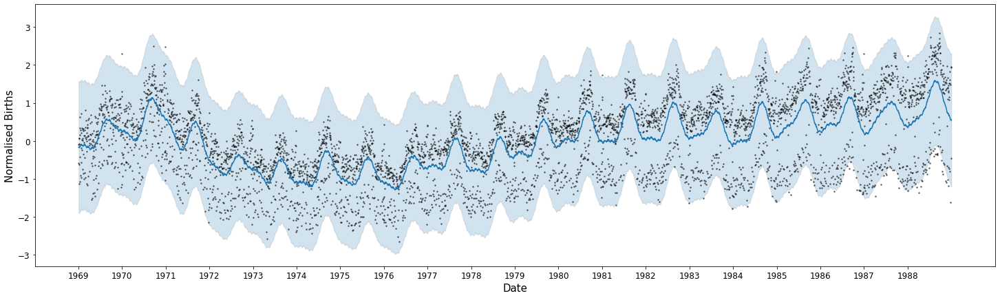

Test


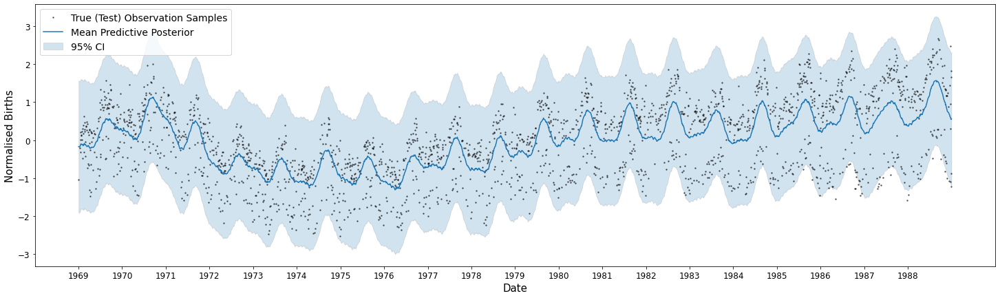

train ELBO, MSE, MAE:  -3601.0572456662567 0.5529728772155219 0.62623261941666
test ELBO, MSE, MAE:  -3676.7190806938534 0.5888179921219128 0.6458756284239237
percentage out of CI (train, test):  1.2321533346371993 1.4598540145985401
number out of CI (train, test):  63 32
Avg. CRPS (train, test):  0.4271069725915417 0.4404092419039844


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.8335669259218385
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.37035580070011
SVGP.kernel.kernels[1].base_kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.7951420761749398
SVGP.kernel.kernels[1].base_kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,1.2034609746983571
SVGP.kernel.kernels[1].period,Parameter,Softplus,Uniform,True,(),float64,30.002753792901494
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,0.7219873284841141
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[2.00143603e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.13079076...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[2.04053486e-01, 0.00000000e+00, 0.00000000e+00..."


--------------------------------------------------------
Starting Value p:  77
Train


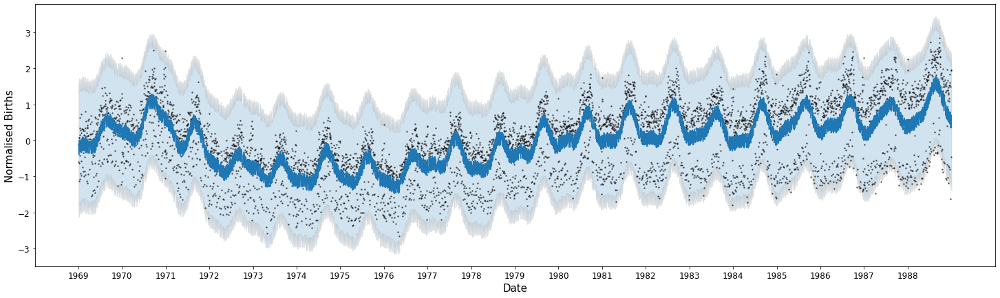

Test


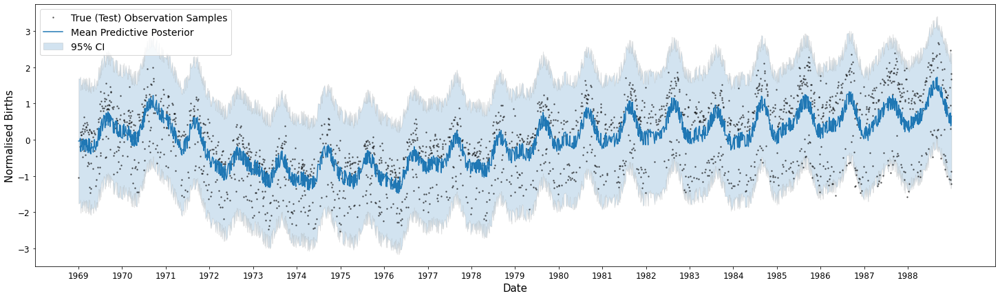

train ELBO, MSE, MAE:  -3429.439891555858 0.4206888727217053 0.5377348492411024
test ELBO, MSE, MAE:  -3500.2003223340603 0.4534624788645369 0.55651168728082
percentage out of CI (train, test):  0.6062976725992567 0.6843065693430658
number out of CI (train, test):  31 15
Avg. CRPS (train, test):  0.37652577150823247 0.3889617353020567


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.843714800356787
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.32304078029408
SVGP.kernel.kernels[1].base_kernel.variance,Parameter,Softplus,Gamma,True,(),float64,1.2661899962277374
SVGP.kernel.kernels[1].base_kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,0.7240541715994537
SVGP.kernel.kernels[1].period,Parameter,Softplus,Uniform,True,(),float64,77.00091498491258
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,0.7088940909394053
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[1.59074906e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-4.85977653e-02...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[1.76445711e-01, 0.00000000e+00, 0.00000000e+00..."


--------------------------------------------------------
Starting Value p:  120
Train


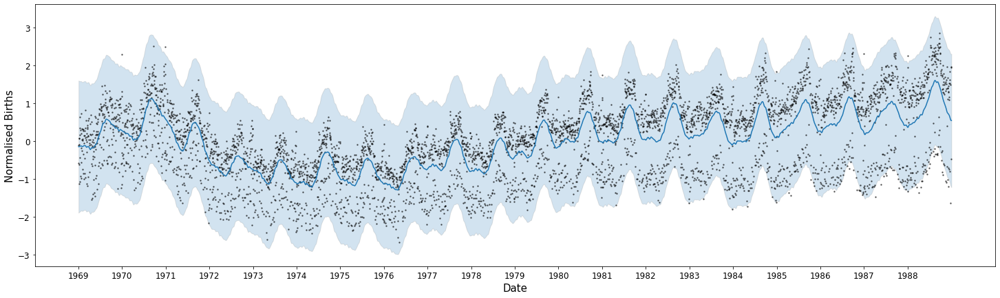

Test


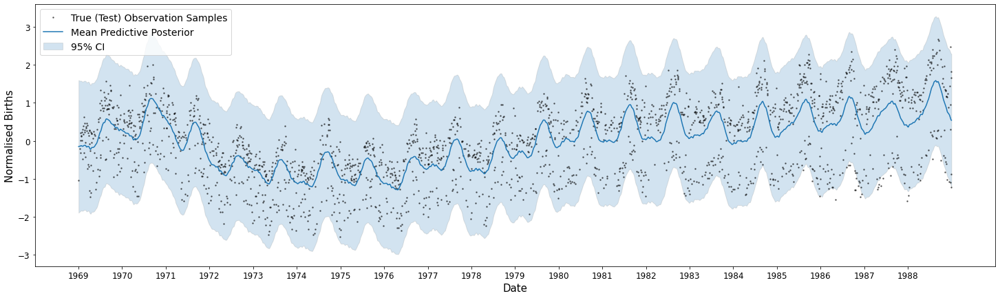

train ELBO, MSE, MAE:  -3600.829263236141 0.5529308816459864 0.6260897857751758
test ELBO, MSE, MAE:  -3676.014834700486 0.5885474566354452 0.6454640897369186
percentage out of CI (train, test):  1.2125953451985134 1.4598540145985401
number out of CI (train, test):  62 32
Avg. CRPS (train, test):  0.4270996693009786 0.44033181538428084


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.8336494212843377
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.36534590512706
SVGP.kernel.kernels[1].base_kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.7929953677591374
SVGP.kernel.kernels[1].base_kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,1.2147561641435651
SVGP.kernel.kernels[1].period,Parameter,Softplus,Uniform,True,(),float64,120.01605964550527
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,0.7220191881524293
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[2.20302567e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-1.14649243e-01...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[2.02839700e-01, 0.00000000e+00, 0.00000000e+00..."


--------------------------------------------------------
Starting Value p:  365
Train


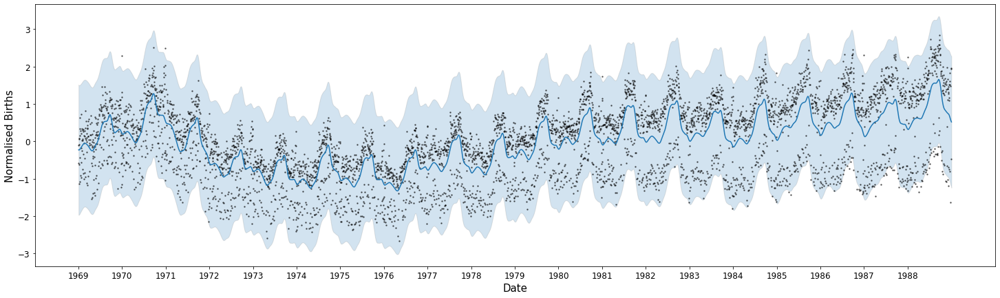

Test


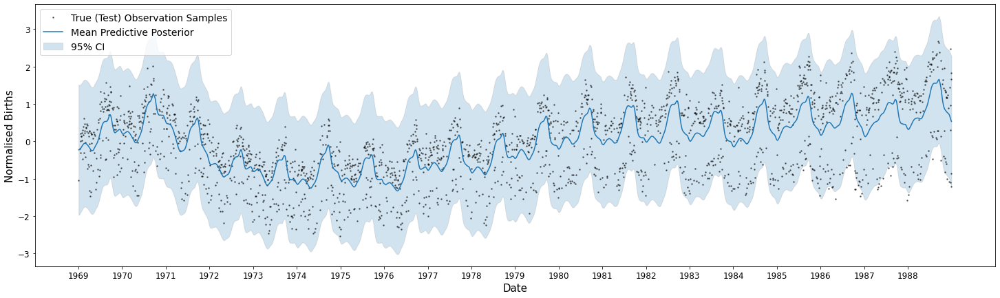

train ELBO, MSE, MAE:  -3573.71659586262 0.5445150284346901 0.6237097196181235
test ELBO, MSE, MAE:  -3637.420839201691 0.574611781145958 0.6402777356821088
percentage out of CI (train, test):  1.2125953451985134 1.2773722627737227
number out of CI (train, test):  62 28
Avg. CRPS (train, test):  0.4240625724332737 0.43521207614389806


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.8146382175305861
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.41425300672076
SVGP.kernel.kernels[1].base_kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.8644415748874348
SVGP.kernel.kernels[1].base_kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,1.055982442080651
SVGP.kernel.kernels[1].period,Parameter,Softplus,Uniform,True,(),float64,365.15346356496684
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,0.7217874304325231
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[1.52939313e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.17596423...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[2.02845525e-01, 0.00000000e+00, 0.00000000e+00..."


--------------------------------------------------------


In [9]:
starting_values_p = [1, 7, 30, 77, 120, 365]

M = 3000

for p in starting_values_p:
    print('Starting Value p: ', p)
    kernel = gpflow.kernels.RBF(lengthscales=77, variance=1) + gpflow.kernels.Periodic(gpflow.kernels.Matern32(), period=p)
    Z = np.linspace(x_train.numpy().min(), x_train.numpy().max(), M)[:, None]
    model = gpflow.models.SVGP(kernel, gpflow.likelihoods.Gaussian(), Z, mean_function=gpflow.mean_functions.Zero(), num_data=M)

    model.likelihood.variance.prior = tfp.distributions.Normal(to_default_float(0), to_default_float(1))
    model.kernel.kernels[0].lengthscales.prior = tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1))
    model.kernel.kernels[0].variance.prior = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))
    model.kernel.kernels[1].base_kernel.lengthscales.prior = tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1))
    model.kernel.kernels[1].base_kernel.variance.prior = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))
    model.kernel.kernels[1].period.prior = tfp.distributions.Uniform(to_default_float(0), to_default_float(1))

    optimise_predict_model(model)
    print('--------------------------------------------------------')

Train


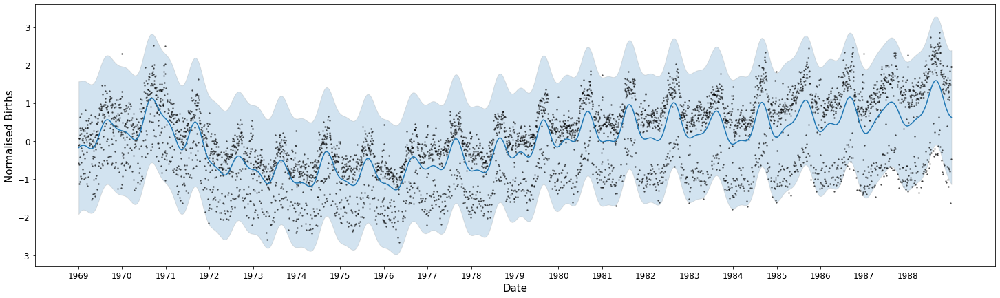

Test


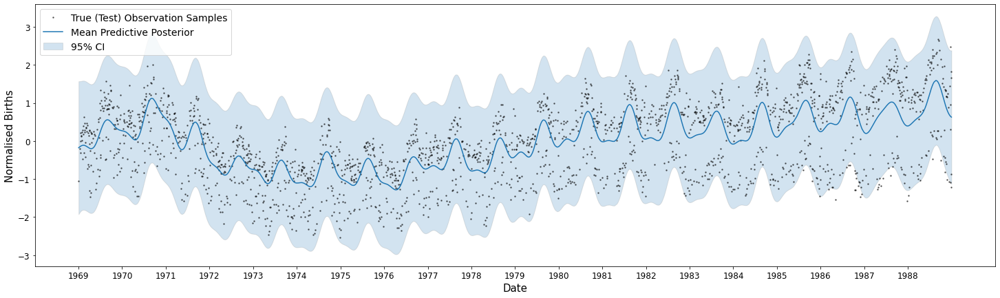

train ELBO, MSE, MAE:  -3588.208256179191 0.5533303183028664 0.6262965515433883
test ELBO, MSE, MAE:  -3659.581794699021 0.587226064948078 0.6448344224223291
percentage out of CI (train, test):  1.3299432818306278 1.5054744525547445
number out of CI (train, test):  68 33
Avg. CRPS (train, test):  0.42705417567151327 0.439632211185968


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.8158890316702875
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.34296753070352
SVGP.kernel.kernels[1].variance,Parameter,Softplus,Gamma,True,(),float64,0.8687272839329018
SVGP.kernel.kernels[1].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,365.32703489860995
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,0.7224726684879713
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[1.79774129e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-1.36222857e-01...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[2.04687947e-01, 0.00000000e+00, 0.00000000e+00..."


--------------------------------------------------------


In [10]:
# Kernel MODEL SELECTION
M = 3000

kernel = gpflow.kernels.RBF(lengthscales=77, variance=1) + gpflow.kernels.Matern52(lengthscales=365)

Z = np.linspace(x_train.numpy().min(), x_train.numpy().max(), M)[:, None]
model = gpflow.models.SVGP(kernel, gpflow.likelihoods.Gaussian(), Z, mean_function=gpflow.mean_functions.Zero(), num_data=M)
model.likelihood.variance.prior = tfp.distributions.Normal(to_default_float(0), to_default_float(1))
model.kernel.kernels[0].lengthscales.prior = tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1))
model.kernel.kernels[0].variance.prior = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))
model.kernel.kernels[1].lengthscales.prior = tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1))
model.kernel.kernels[1].variance.prior = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))

optimise_predict_model(model)
print('--------------------------------------------------------')

l= 1
Train


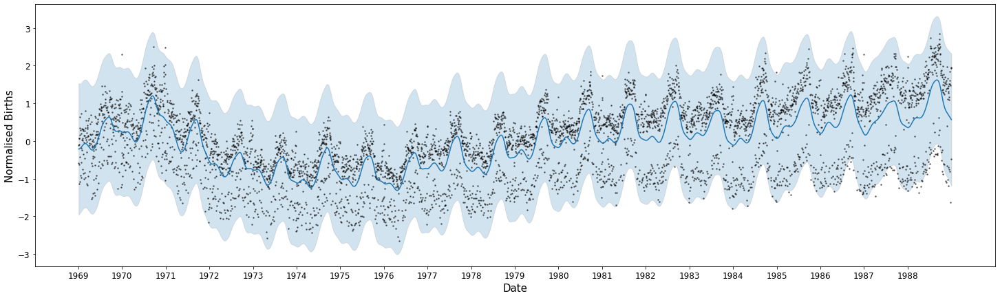

Test


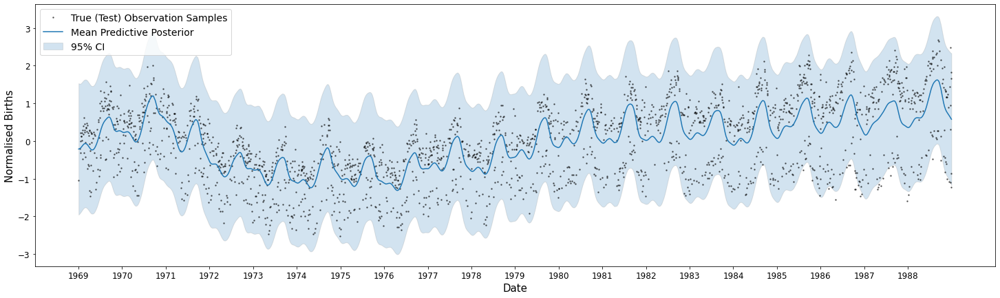

train ELBO, MSE, MAE:  -3576.531357752856 0.5488415770199193 0.6254767658211386
test ELBO, MSE, MAE:  -3638.812921681384 0.578319308805852 0.6412319233704293
percentage out of CI (train, test):  1.1734793663211422 1.4142335766423357
number out of CI (train, test):  60 31
Avg. CRPS (train, test):  0.4256615069692233 0.4365377524371187


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.8150763843921266
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.41290388300497
SVGP.kernel.kernels[1].base_kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.8551873536603225
SVGP.kernel.kernels[1].base_kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,1.0184839131795262
SVGP.kernel.kernels[1].period,Parameter,Softplus,Uniform,True,(),float64,365.1710982867789
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,0.7223244114737267
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[1.66897028e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-1.63854632e-01...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[2.01537723e-01, 0.00000000e+00, 0.00000000e+00..."


--------------------------------------------------------
l= 7
Train


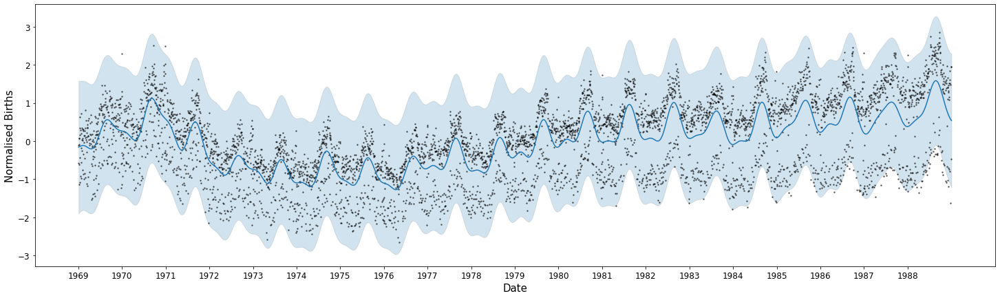

Test


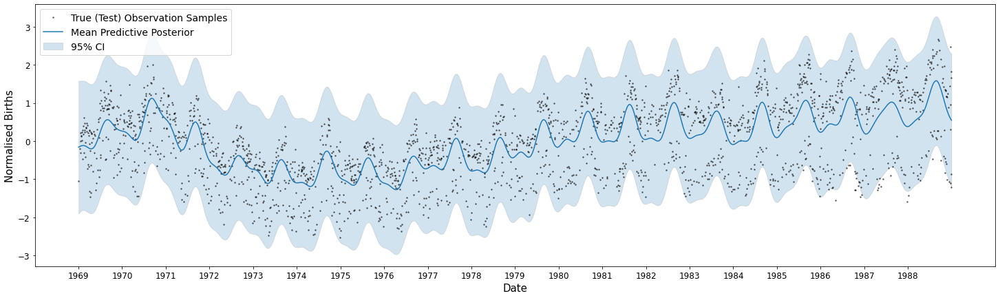

train ELBO, MSE, MAE:  -3585.3745104720983 0.5533620265918681 0.6263443114052961
test ELBO, MSE, MAE:  -3656.6040235181777 0.5871947896416578 0.6449278573873358
percentage out of CI (train, test):  1.2908273029532564 1.4142335766423357
number out of CI (train, test):  66 31
Avg. CRPS (train, test):  0.42718904517426576 0.43975377914849423


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.8304111928892847
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.36406430044451
SVGP.kernel.kernels[1].base_kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.8259215589575792
SVGP.kernel.kernels[1].base_kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,6.510010370370233
SVGP.kernel.kernels[1].period,Parameter,Softplus,Uniform,True,(),float64,364.6676638464909
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,0.7225184720939638
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[1.64533538e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.12374783...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[2.01038123e-01, 0.00000000e+00, 0.00000000e+00..."


--------------------------------------------------------
l= 30
Train


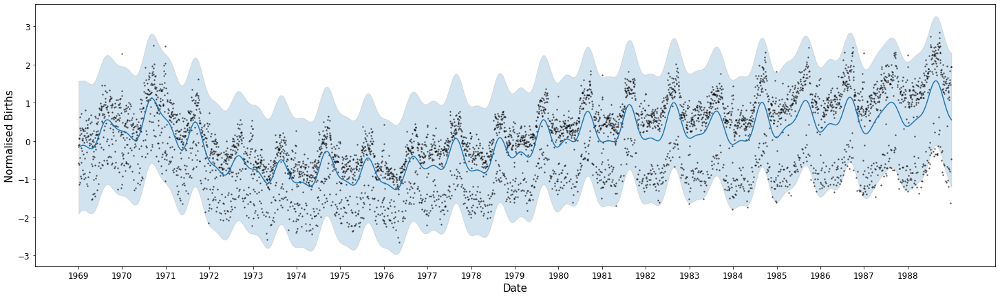

Test


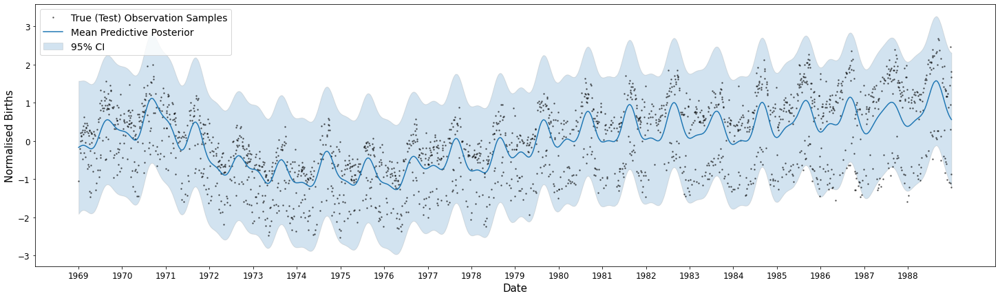

train ELBO, MSE, MAE:  -3586.3980146188605 0.5534531819815331 0.6262766004829845
test ELBO, MSE, MAE:  -3657.6676699582467 0.5873034847765621 0.6448589247668732
percentage out of CI (train, test):  1.2908273029532564 1.3686131386861315
number out of CI (train, test):  66 30
Avg. CRPS (train, test):  0.4272091885181778 0.4397863521615022


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.8342253685432368
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.35827814169066
SVGP.kernel.kernels[1].base_kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.7896017634676922
SVGP.kernel.kernels[1].base_kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,29.503184199304997
SVGP.kernel.kernels[1].period,Parameter,Softplus,Uniform,True,(),float64,364.6147730810917
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,0.7225035304119997
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[1.64222959e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-1.30290411e-01...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[2.02137533e-01, 0.00000000e+00, 0.00000000e+00..."


--------------------------------------------------------


In [8]:
# Kernel MODEL SELECTION
ls = [1, 7, 30]

M = 3000

for l in ls:
    print('l=',l)

    kernel = gpflow.kernels.RBF(lengthscales=77, variance=1) + gpflow.kernels.Periodic(gpflow.kernels.Matern52(lengthscales=l), period=365)

    Z = np.linspace(x_train.numpy().min(), x_train.numpy().max(), M)[:, None]
    model = gpflow.models.SVGP(kernel, gpflow.likelihoods.Gaussian(), Z, mean_function=gpflow.mean_functions.Zero(), num_data=M)
    model.likelihood.variance.prior = tfp.distributions.Normal(to_default_float(0), to_default_float(1))
    model.kernel.kernels[0].lengthscales.prior = tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1))
    model.kernel.kernels[0].variance.prior = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))
    model.kernel.kernels[1].base_kernel.lengthscales.prior = tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1))
    model.kernel.kernels[1].base_kernel.variance.prior = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))
    model.kernel.kernels[1].period.prior = tfp.distributions.Uniform(to_default_float(0), to_default_float(1))

    optimise_predict_model(model)
    print('--------------------------------------------------------')

# Try 3 latent GP functions

Train


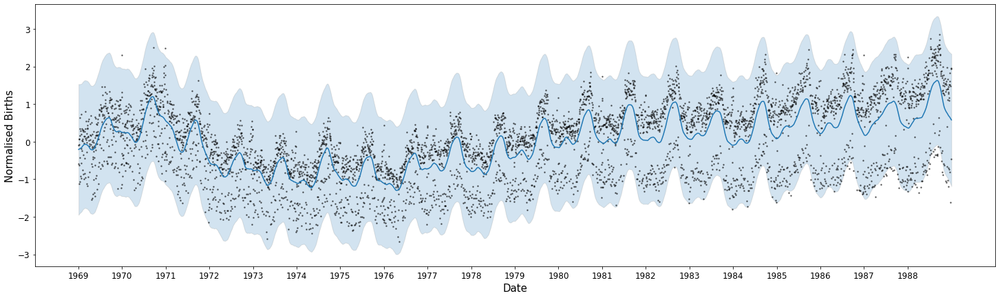

Test


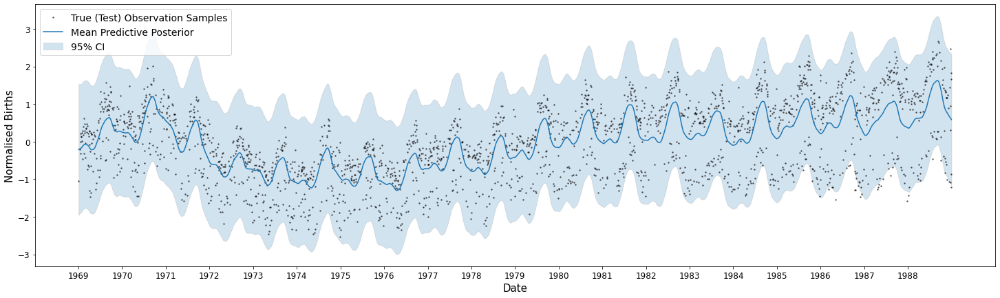

train ELBO, MSE, MAE:  -3611.662826518903 0.5489777249465252 0.6245135599931629
test ELBO, MSE, MAE:  -3675.5642687197496 0.5788483567267755 0.6404870600635096
percentage out of CI (train, test):  1.1148053980050852 1.322992700729927
number out of CI (train, test):  57 29
Avg. CRPS (train, test):  0.42578623939516713 0.4367221338143875


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.8139764306922833
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.41697570734786
SVGP.kernel.kernels[1].base_kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.8014115550239117
SVGP.kernel.kernels[1].base_kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,1.00202780337071
SVGP.kernel.kernels[1].period,Parameter,Softplus,Uniform,True,(),float64,365.2038497934426
SVGP.kernel.kernels[2].base_kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.763846177221453
SVGP.kernel.kernels[2].base_kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,1.2499747441586482
SVGP.kernel.kernels[2].period,Parameter,Softplus,Uniform,True,(),float64,1.013694896545504
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,0.7218965635362797
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[1.94479058e+00...


--------------------------------------------------------
Train


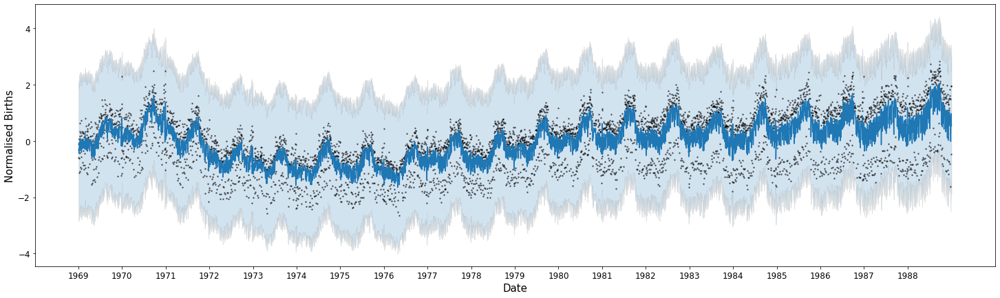

Test


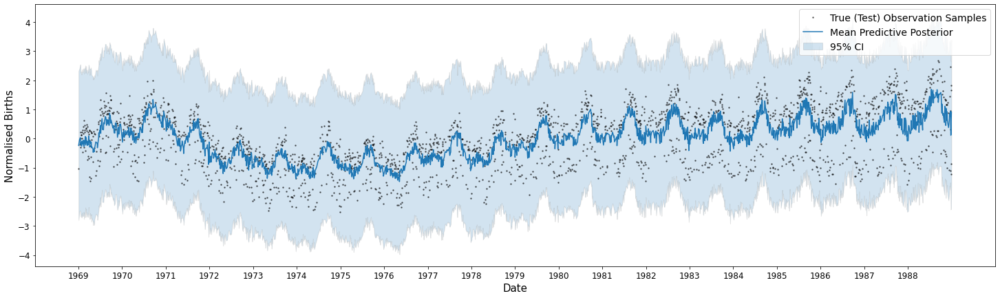

train ELBO, MSE, MAE:  -4356.657600125603 0.30974230950480736 0.46450968169449725
test ELBO, MSE, MAE:  -4917.053092696956 0.5436010854393437 0.6170721729310162
percentage out of CI (train, test):  0.0 0.0
number out of CI (train, test):  0 0
Avg. CRPS (train, test):  0.38226507499102974 0.4574487492707963


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.8156048593452945
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.38251833270418
SVGP.kernel.kernels[1].base_kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.8371346736159366
SVGP.kernel.kernels[1].base_kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,1.0907499253421997
SVGP.kernel.kernels[1].period,Parameter,Softplus,Uniform,True,(),float64,365.2739680274577
SVGP.kernel.kernels[2].variance,Parameter,Softplus,Gamma,True,(),float64,0.7425471824929811
SVGP.kernel.kernels[2].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,1.3317772633203224
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,0.984383525708889
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[2.21954221e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.19222138...


--------------------------------------------------------
Train


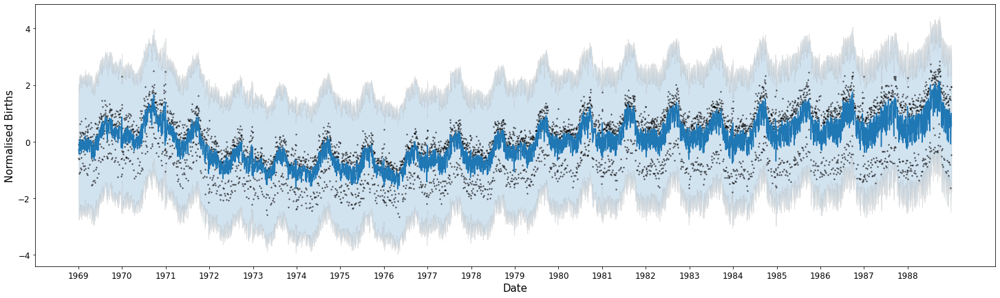

Test


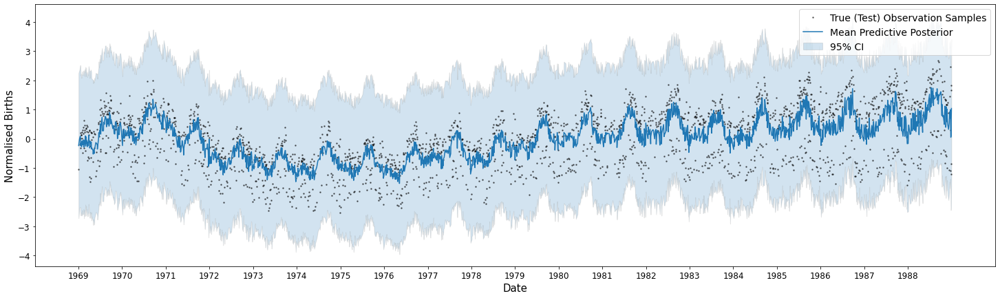

train ELBO, MSE, MAE:  -4288.142483783373 0.29634222177274316 0.4526403271200219
test ELBO, MSE, MAE:  -4892.990675027158 0.5343402420967795 0.6095710639296728
percentage out of CI (train, test):  0.0 0.0
number out of CI (train, test):  0 0
Avg. CRPS (train, test):  0.3714451015766188 0.45015682497325543


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.kernels[0].variance,Parameter,Softplus,Gamma,True,(),float64,0.8137006892399643
SVGP.kernel.kernels[0].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,77.38163167618478
SVGP.kernel.kernels[1].base_kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.834640606463274
SVGP.kernel.kernels[1].base_kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,1.0944205385389818
SVGP.kernel.kernels[1].period,Parameter,Softplus,Uniform,True,(),float64,365.3011951596707
SVGP.kernel.kernels[2].variance,Parameter,Softplus,Gamma,True,(),float64,0.7455660504419382
SVGP.kernel.kernels[2].lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,1.3247390779042918
SVGP.likelihood.variance,Parameter,Softplus + Shift,Normal,True,(),float64,0.9335096982667954
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[2.21045503e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.18721862...


--------------------------------------------------------


: 

In [25]:
# Kernel MODEL SELECTION
kernel_list = [gpflow.kernels.Linear(), gpflow.kernels.Periodic(gpflow.kernels.Matern52()), gpflow.kernels.Matern52(), gpflow.kernels.RBF()]

M = 3000

for i in range(len(kernel_list)):
    print(kernel_list[i])

    kernel = gpflow.kernels.RBF(lengthscales=77, variance=1) + gpflow.kernels.Periodic(gpflow.kernels.Matern52(), period=365.25) + kernel_list[i]

    Z = np.linspace(x_train.numpy().min(), x_train.numpy().max(), M)[:, None]
    model = gpflow.models.SVGP(kernel, gpflow.likelihoods.Gaussian(), Z, mean_function=gpflow.mean_functions.Zero(), num_data=M)
    model.likelihood.variance.prior = tfp.distributions.Normal(to_default_float(0), to_default_float(1))
    model.kernel.kernels[0].lengthscales.prior = tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1))
    model.kernel.kernels[0].variance.prior = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))
    model.kernel.kernels[1].period.prior = tfp.distributions.Uniform(to_default_float(1), to_default_float(400))
    model.kernel.kernels[1].base_kernel.lengthscales.prior = tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1))
    model.kernel.kernels[1].base_kernel.variance.prior = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))

    if i == 0:
        continue
    elif i == 1:
        model.kernel.kernels[2].period.prior = tfp.distributions.Uniform(to_default_float(1), to_default_float(400))
        model.kernel.kernels[2].base_kernel.lengthscales.prior = tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1))
        model.kernel.kernels[2].base_kernel.variance.prior = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))
    else:
        model.kernel.kernels[2].lengthscales.prior = tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1))
        model.kernel.kernels[2].variance.prior = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))
    
    optimise_predict_model(model)
    print('--------------------------------------------------------')